In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

Import & Clean Data:

In [228]:
df1 = pd.read_csv('hourly_90-94.csv')
df2 = pd.read_csv('hourly_95-99.csv')
df3 = pd.read_csv('hourly_00-04.csv')
df4 = pd.read_csv('hourly_05-09.csv')
df5 = pd.read_csv('hourly_10-14.csv')
df6 = pd.read_csv('hourly_15-19.csv')
df7 = pd.read_csv('hourly_20-23.csv')

In [229]:
df = pd.concat([df1, df2, df3, df4, df5, df6, df7], ignore_index=True)
SO2 = df[df['POLLUTANT'] == 'Sulphur Dioxide']
CO = df[df['POLLUTANT'] == 'Carbon Monoxide']
PM25 = df[df['POLLUTANT'] == 'Fine Suspended Particulates ']       # does not exist in the data
NO2 = df[df['POLLUTANT'] == 'Nitrogen Dioxide']
NOX = df[df['POLLUTANT'] == 'Nitrogen Oxides']
O3 = df[df['POLLUTANT'] == 'Ozone']
PM10 = df[df['POLLUTANT'] == 'Respirable Suspended Particulates']

In [230]:
''' ONLY RUN THIS CELL ONCE TO CREATE THE CSV FILES & STATIONS LIST '''
# SO2.to_csv('SO2.csv', index=False)
# CO.to_csv('CO.csv', index=False)
# NO2.to_csv('NO2.csv', index=False)
# NOX.to_csv('NOX.csv', index=False)
# O3.to_csv('O3.csv', index=False)
# PM10.to_csv('PM10.csv', index=False)
# PM25.to_csv('PM25.csv', index=False)
Stations = SO2.columns[3:]
Parameters = ['SO2', 'CO', 'NO2', 'NOX', 'O3', 'PM10', 'PM25']

In [231]:
''' FUNCTION TO CLEAN THE DATA '''
def clean(df, Stations):
    df['DATE'] = pd.to_datetime(df['DATE'])
    df['HOUR'] = pd.to_datetime(df['HOUR']-1, format='%H').dt.time
    df['DATE'] = pd.to_datetime(df['DATE'].astype(str) + ' ' + df['HOUR'].astype(str))
    df = df.drop(columns=['HOUR'])
    df = df.set_index('DATE')
    df = df.sort_values(by='DATE')
    df = df.replace('N.A.', np.nan)
    df = df.replace('NoData', np.nan)
    df = df.drop(columns=['POLLUTANT'])
    df[Stations] = df[Stations].astype(float)
    df['Average'] = df[Stations].mean(axis=1)
    df['Average'] = df['Average'].astype(float)
    return df

In [232]:
''' CLEANING THE DATA '''
SO2 = clean(SO2, Stations)
CO = clean(CO, Stations)
NO2 = clean(NO2, Stations)
# NOX = clean(NOX, Stations)
O3 = clean(O3, Stations)
PM10 = clean(PM10, Stations)
PM25 = clean(PM25, Stations)

c:\Users\ahirs\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '13/01/1990' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
c:\Users\ahirs\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '14/01/1990' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
c:\Users\ahirs\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '15/01/1990' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
c:\Users\ahirs\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '16/01/1990' in DD/MM/YYYY format. Provide format or specif

In [7]:
# SO2.to_csv('SO2.csv', index=False)
# CO.to_csv('CO.csv', index=False)
# NO2.to_csv('NO2.csv', index=False)
# NOX.to_csv('NOX.csv', index=False)
# O3.to_csv('O3.csv', index=False)
# PM10.to_csv('PM10.csv', index=False)
# PM25.to_csv('PM25.csv', index=False)

KeyboardInterrupt: 

... rest of the real code ...

Testing area(not part of the final code):

In [8]:
''' PLOTTING THE DATA OF SO2 AS A TEST '''
def plotting(df, df2 = None, df3 = None, df4 = None, df5 = None, df6 = None, df7 = None, all = False, Stations = Stations, rolling = 24*7):
    plt.figure(figsize=(15, 10))
    if all:
        for station in Stations:
            plt.plot(df['DATE'], df[station].astype(float), label=station, alpha=0.5)
    plt.plot(df['DATE'], df['Average'].rolling(rolling).mean(), label=df['POLLUTANT'].unique()[0], color='black', linewidth=1)
    if df2 is not None:
        plt.plot(df2['DATE'], df2['Average'].rolling(rolling).mean(), label=df2['POLLUTANT'].unique()[0], linewidth=1)
    if df3 is not None:
        plt.plot(df3['DATE'], df3['Average'].rolling(rolling).mean(), label=df3['POLLUTANT'].unique()[0], linewidth=1)
    if df4 is not None:
        plt.plot(df4['DATE'], df4['Average'].rolling(rolling).mean(), label=df4['POLLUTANT'].unique()[0], linewidth=1)
    if df5 is not None:
        plt.plot(df5['DATE'], df5['Average'].rolling(rolling).mean(), label=df5['POLLUTANT'].unique()[0], linewidth=1)
    if df6 is not None:
        plt.plot(df6['DATE'], df6['Average'].rolling(rolling).mean(), label=df6['POLLUTANT'].unique()[0], linewidth=1)
    if df7 is not None:
        plt.plot(df7['DATE'], df7['Average'].rolling(rolling).mean(), label=df7['POLLUTANT'].unique()[0], linewidth=1)
    plt.legend(loc='upper right')

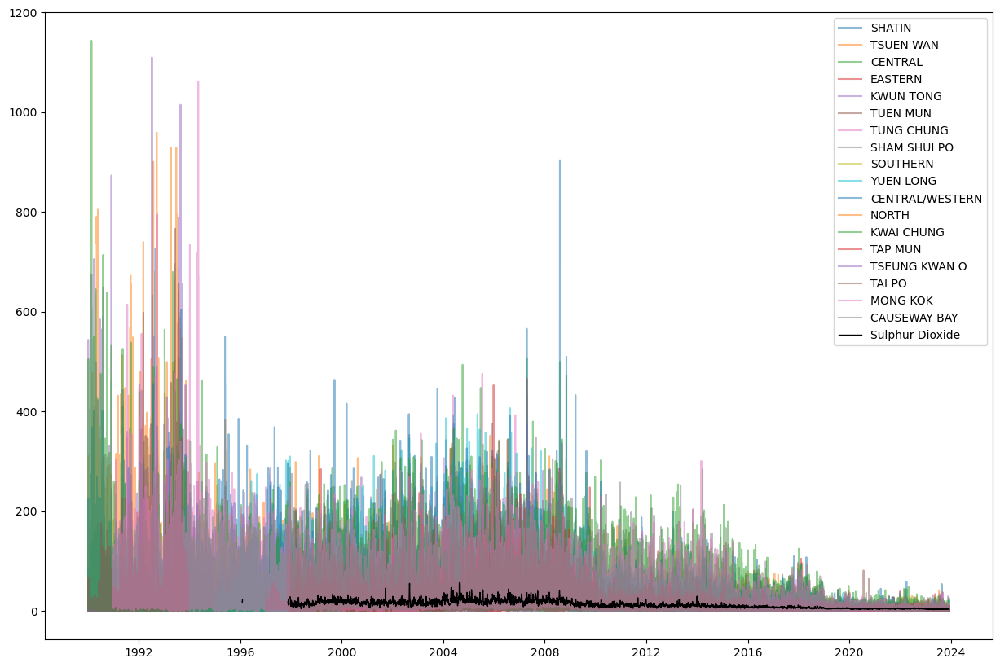

In [9]:
plotting(SO2, all=True)

# Prepare data to get AQI:

Transform to the right format:<br>
O3: ppm with 3 decimals<br>
PM2.5: $\mu g/m^3$ with 1 decimal<br>
PM10: $\mu g/m^3$ as integer <br>
CO: ppm with 1 decimal<br>
SO2: ppb as integer<br>
NO2 ppb as integer

In [240]:
# dict with the transformation factors, the number of decimals to round to and the hours:
transform = {'SO2': (24.45/64.07, 0, 1), 'CO': (24.45/28.01, 1, 8), 'NO2': (24.45/46.0055, 0, 1), 'O3': (24.45/48.0, 3, [1, 8]), 'PM10': (1, 0, 24), 'PM25': (1, 1, 24)}
transform

{'SO2': (0.38161385984079915, 0, 1),
 'CO': (0.8729025348089967, 1, 8),
 'NO2': (0.5314581952157894, 0, 1),
 'O3': (0.509375, 3, [1, 8]),
 'PM10': (1, 0, 24),
 'PM25': (1, 1, 24)}

In [238]:
SO2['Average'].max()

330.0

In [235]:
breakpoints = pd.read_csv('breakpoints.csv')
breakpoints.iloc[2:16, :-1] = breakpoints.iloc[2:16, :-1].astype(float)
breakpoints

,O3_8,O3_1,PM25,PM10,CO,SO2,NO2,AQI,Category
0,ppm,ppm,mug/m 3,mg/m 3,ppm,ppb,ppb,NaN,NaN
1,8-hour,1-hour1,24-hour,24-hour,8-hour,1-hour,1-hour,NaN,NaN
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good min
3,0.054,0.001,12.0,54.0,4.4,35.0,53.0,50.0,Good max
4,0.055,0.002,12.1,55.0,4.5,36.0,54.0,51.0,Moderate min
5,0.07,0.124,35.4,154.0,9.4,75.0,100.0,100.0,Moderate max
6,0.071,0.125,35.5,155.0,9.5,76.0,101.0,101.0,Unhealthy for Sensitive Groups min
7,0.085,0.164,55.4,254.0,12.4,185.0,360.0,150.0,Unhealthy for Sensitive Groups max
8,0.086,0.165,55.5,255.0,12.5,186.0,361.0,151.0,Unhealthy min
9,0.105,0.204,150.4,354.0,15.4,304.0,649.0,200.0,Unhealthy max


In [123]:
x = 'CO'
# print all columns of breakpoints that contain the value of x in the index:
a = breakpoints[[col for col in breakpoints.columns if x in col]]
a.iloc[3, 0]

'4.4'

Make AQI dataset (AQI of all stations for all timestamps)

In [272]:
''' TEST '''
pollutant = 'SO2'
bp = breakpoints[[col for col in breakpoints.columns if pollutant in col]]
float(bp.iloc[6, 0])
IAQI_CO

,SHATIN,TSUEN WAN,CENTRAL,EASTERN,KWUN TONG,TUEN MUN,TUNG CHUNG,SHAM SHUI PO,SOUTHERN,YUEN LONG,CENTRAL/WESTERN,NORTH,KWAI CHUNG,TAP MUN,TSEUNG KWAN O,TAI PO,MONG KOK,CAUSEWAY BAY,Average
DATE,,,,,,,,,,,,,,,,,,,
1991-01-04 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1991-01-04 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70.0
1991-01-04 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.0
1991-01-04 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,62.0
1991-01-04 04:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1991-04-18 11:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,103.6625,NaN,192.0
1991-04-18 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,111.3000,NaN,119.0
1991-04-18 13:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,121.2250,NaN,146.0


In [248]:
def get_IAQI(df, pollutant, transform = transform, breakpoints = breakpoints, Stations = Stations):
    # get the data ready in the right format:
    df = df.head(1000)            # for testing purposes
    df[Stations] = round(df[Stations].apply(lambda x: x*transform[pollutant][0]), transform[pollutant][1])
    if pollutant == 'O3':
        df2 = df
        df2[Stations] = df2[Stations].rolling(transform[pollutant][2][1]).mean()
    else:
        if transform[pollutant][2] != 1:
            df[Stations] = df[Stations].rolling(transform[pollutant][2]).mean()
    # calculate the IAQI:
    IAQI = df
    bp = breakpoints[[col for col in breakpoints.columns if pollutant in col]]
    for station in Stations:
        for time in range(len(df)):
            for i in range(3,15):
                if df[station].iloc[time] <= float(bp.iloc[i, 0]):
                    max_index = i
                    # bp.iloc[max_index, 0] - bp.iloc[max_index-1, 0]
                    IAQI[station].iloc[time] = breakpoints.iloc[max_index-1, 7] + (df[station].iloc[time] - bp.iloc[max_index-1, 0])*(breakpoints.iloc[max_index, 7] - breakpoints.iloc[max_index-1, 7])/(bp.iloc[max_index, 0] - bp.iloc[max_index-1, 0])
                    break
    if bp.shape[1] > 1:
        IAQI2 = df2
        for station in Stations:
            for time in range(len(df)):
                for i in range(3,15):
                    if df2[station].iloc[time] <= float(bp.iloc[i, 1]):
                        max_index = i
                        IAQI2[station].iloc[time] = breakpoints.iloc[max_index-1, 7] + (df2[station].iloc[time] - bp.iloc[max_index-1, 1])*(breakpoints.iloc[max_index, 7] - breakpoints.iloc[max_index-1, 7])/(bp.iloc[max_index, 1] - bp.iloc[max_index-1, 1])
                        break
        return IAQI, IAQI2
    return IAQI

# this function takes very long to run, can you make it more efficient?

IAQI does not properly work. too many values get NAN

In [277]:
IAQI_SO2 = get_IAQI(SO2, 'SO2')
IAQI_CO = get_IAQI(CO, 'CO')
IAQI_NO2 = get_IAQI(NO2, 'NO2')
# IAQI_NOX = get_IAQI(NOX, 'NOX')
IAQI_O3_1, IAQI_O3_8 = get_IAQI(O3, 'O3')
IAQI_PM10 = get_IAQI(PM10, 'PM10')
IAQI_PM25 = get_IAQI(PM25, 'PM25')

C:\Users\ahirs\AppData\Local\Temp\ipykernel_20556\989407353.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[Stations] = round(df[Stations].apply(lambda x: x*transform[pollutant][0]), transform[pollutant][1])
C:\Users\ahirs\AppData\Local\Temp\ipykernel_20556\989407353.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  IAQI[station].iloc[time] = breakpoints.iloc[max_index-1, 7] + (df[station].iloc[time] - bp.iloc[max_index-1, 0])*(breakpoints.iloc[max_index, 7] - breakpoints.iloc[max_index-1, 7])/(bp.iloc[max_index, 0] - bp.iloc[max_index-1, 0])
C:\Users\a

,SHATIN,TSUEN WAN,CENTRAL,EASTERN,KWUN TONG,TUEN MUN,TUNG CHUNG,SHAM SHUI PO,SOUTHERN,YUEN LONG,CENTRAL/WESTERN,NORTH,KWAI CHUNG,TAP MUN,TSEUNG KWAN O,TAI PO,MONG KOK,CAUSEWAY BAY,Average
DATE,,,,,,,,,,,,,,,,,,,
1999-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,66.000000
1999-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.000000
1999-01-01 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64.000000
1999-01-01 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.000000
1999-01-01 04:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55.333333


AQI does not give proper results because IAQI does not properly work

In [274]:
def get_AQI(IAQI_SO2, IAQI_CO, IAQI_NO2, IAQI_O3_1, IAQI_O3_8, IAQI_PM10, IAQI_PM25, Stations = Stations):
    AQI = IAQI_SO2
    for stations in Stations:
        for time in range(len(AQI)):
            AQI[stations].iloc[time] = max(IAQI_SO2[stations].iloc[time], IAQI_CO[stations].iloc[time], IAQI_NO2[stations].iloc[time], IAQI_O3_1[stations].iloc[time], IAQI_O3_8[stations].iloc[time], IAQI_PM10[stations].iloc[time], IAQI_PM25[stations].iloc[time])
    return AQI
AQI = get_AQI(IAQI_SO2, IAQI_CO, IAQI_NO2, IAQI_O3_1, IAQI_O3_8, IAQI_PM10, IAQI_PM25)
AQI

C:\Users\ahirs\AppData\Local\Temp\ipykernel_20556\2526982377.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  AQI[stations].iloc[time] = max(IAQI_SO2[stations].iloc[time], IAQI_CO[stations].iloc[time], IAQI_NO2[stations].iloc[time], IAQI_O3_1[stations].iloc[time], IAQI_O3_8[stations].iloc[time], IAQI_PM10[stations].iloc[time], IAQI_PM25[stations].iloc[time])


,SHATIN,TSUEN WAN,CENTRAL,EASTERN,KWUN TONG,TUEN MUN,TUNG CHUNG,SHAM SHUI PO,SOUTHERN,YUEN LONG,CENTRAL/WESTERN,NORTH,KWAI CHUNG,TAP MUN,TSEUNG KWAN O,TAI PO,MONG KOK,CAUSEWAY BAY,Average
DATE,,,,,,,,,,,,,,,,,,,
1990-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1990-01-01 01:00:00,NaN,23.584906,NaN,NaN,18.867925,NaN,NaN,24.528302,NaN,NaN,30.188679,NaN,21.428571,NaN,NaN,NaN,NaN,NaN,12.600000
1990-01-01 02:00:00,NaN,19.811321,NaN,NaN,16.981132,NaN,NaN,24.528302,NaN,NaN,21.698113,NaN,20.000000,NaN,NaN,NaN,NaN,NaN,12.200000
1990-01-01 03:00:00,NaN,16.981132,NaN,NaN,15.094340,NaN,NaN,26.415094,NaN,NaN,19.811321,NaN,18.571429,NaN,NaN,NaN,NaN,NaN,11.000000
1990-01-01 04:00:00,NaN,16.037736,NaN,NaN,9.433962,NaN,NaN,19.811321,NaN,NaN,16.981132,NaN,14.285714,NaN,NaN,NaN,NaN,NaN,10.600000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1990-02-11 11:00:00,NaN,83.561516,NaN,NaN,37.735849,NaN,NaN,35.849057,NaN,NaN,35.849057,NaN,56.423822,NaN,NaN,11.320755,NaN,NaN,16.166667
1990-02-11 12:00:00,NaN,82.948140,NaN,NaN,34.905660,NaN,NaN,1.428571,NaN,NaN,36.792453,NaN,56.691919,NaN,NaN,13.207547,NaN,NaN,14.166667
1990-02-11 13:00:00,NaN,83.035765,NaN,NaN,33.962264,NaN,NaN,NaN,NaN,NaN,37.735849,NaN,57.228114,NaN,NaN,13.207547,NaN,NaN,16.400000
